### Imports

In [306]:
import numpy as np
import matplotlib.pyplot as plt
import os
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib import colors as mcolors
from cdo import Cdo
import matplotlib.path as mpath
import pandas as pd
import warnings
import cftime
from xarray.coding.times import SerializationWarning
import importlib

# my own functions
import Functions

importlib.reload(Functions)

from Functions import *



### Opening data

#### Retrieving data filepaths

In [307]:
def filepath(data_scenario, months, detrend = 'detrended'):
    if months == 1:
        file_tas = [f for f in os.listdir(data_scenario) if f.startswith('detrended_tas')][0]
        file_prsn = [f for f in os.listdir(data_scenario) if f.startswith('detrended_prsn')][0]
        file_pr = [f for f in os.listdir(data_scenario) if f.startswith('detrended_pr.')][0]
        file_snfr = [f for f in os.listdir(data_scenario) if f.startswith('snfr')][0]
    elif months == 12:
        if detrend == 'detrended':
            file_tas = [f for f in os.listdir(data_scenario) if f.startswith('detrended_yearly_tas')][0]
            file_prsn = [f for f in os.listdir(data_scenario) if f.startswith('detrended_yearly_prsn')][0]
            file_pr = [f for f in os.listdir(data_scenario) if f.startswith('detrended_yearly_pr.')][0]
            file_snfr = [f for f in os.listdir(data_scenario) if f.startswith('detrended_yearly_snfr')][0]
        else:
            file_tas = [f for f in os.listdir(data_scenario) if f.startswith('yearly_tas')][0]
            file_prsn = [f for f in os.listdir(data_scenario) if f.startswith('yearly_prsn')][0]
            file_pr = [f for f in os.listdir(data_scenario) if f.startswith('yearly_pr.')][0]
            file_snfr = [f for f in os.listdir(data_scenario) if f.startswith('yearly_snfr')][0]
    else:
        print('specify yearly or monthly data')
    return data_scenario + '/' + file_tas, data_scenario + '/' + file_prsn, data_scenario + '/' + file_pr, data_scenario + '/' + file_snfr


EC_earth_dir = '/nobackup/users/hartevel/data/EC_earth/data'

data_pi = EC_earth_dir + '/pi_control_smhi'
data_2K = EC_earth_dir + '/gwl2p0_knmi'
data_4K = EC_earth_dir + '/gwl4p0_dmi'

file_tas_pi, file_prsn_pi, file_pr_pi, file_snfr_pi = filepath(data_pi, 1)
file_tas_2K, file_prsn_2K, file_pr_2K, file_snfr_2K = filepath(data_2K, 1)
file_tas_4K, file_prsn_4K, file_pr_4K, file_snfr_4K = filepath(data_4K, 1)

yearly_file_tas_pi, yearly_file_prsn_pi, yearly_file_pr_pi, yearly_file_snfr_pi = filepath(data_pi, 12, 'non')
yearly_file_tas_2K, yearly_file_prsn_2K, yearly_file_pr_2K, yearly_file_snfr_2K = filepath(data_2K, 12, 'non')
yearly_file_tas_4K, yearly_file_prsn_4K, yearly_file_pr_4K, yearly_file_snfr_4K = filepath(data_4K, 12, 'non')

detrended_yearly_file_tas_pi, detrended_yearly_file_prsn_pi, detrended_yearly_file_pr_pi, detrended_yearly_file_snfr_pi = filepath(data_pi, 12)
detrended_yearly_file_tas_2K, detrended_yearly_file_prsn_2K, detrended_yearly_file_pr_2K, detrended_yearly_file_snfr_2K = filepath(data_2K, 12)
detrended_yearly_file_tas_4K, detrended_yearly_file_prsn_4K, detrended_yearly_file_pr_4K, detrended_yearly_file_snfr_4K = filepath(data_4K, 12)

#### Opening data

In [312]:
# Opening pi
tas_pi = xr.open_dataset(file_tas_pi)['__xarray_dataarray_variable__']
pr_pi = xr.open_dataset(file_pr_pi)['__xarray_dataarray_variable__']
prsn_pi = xr.open_dataset(file_prsn_pi)['__xarray_dataarray_variable__']
snfr_pi = xr.open_dataset(file_snfr_pi)['__xarray_dataarray_variable__']

tas_pi_yearly = xr.open_dataset(yearly_file_tas_pi)['tas']
pr_pi_yearly = xr.open_dataset(yearly_file_pr_pi)['pr']
prsn_pi_yearly = xr.open_dataset(yearly_file_prsn_pi)['prsn']
snfr_pi_yearly = xr.open_dataset(yearly_file_snfr_pi)['__xarray_dataarray_variable__']

detrended_tas_pi_yearly = xr.open_dataset(detrended_yearly_file_tas_pi)['__xarray_dataarray_variable__']
detrended_pr_pi_yearly = xr.open_dataset(detrended_yearly_file_pr_pi)['__xarray_dataarray_variable__']
detrended_prsn_pi_yearly = xr.open_dataset(detrended_yearly_file_prsn_pi)['__xarray_dataarray_variable__']
detrended_snfr_pi_yearly = xr.open_dataset(detrended_yearly_file_snfr_pi)['__xarray_dataarray_variable__']

# Opening 2K
tas_2K = xr.open_dataset(file_tas_2K)['__xarray_dataarray_variable__']
pr_2K = xr.open_dataset(file_pr_2K)['__xarray_dataarray_variable__']
prsn_2K = xr.open_dataset(file_prsn_2K)['__xarray_dataarray_variable__']
snfr_2K = xr.open_dataset(file_snfr_2K)['__xarray_dataarray_variable__']

tas_2K_yearly = xr.open_dataset(yearly_file_tas_2K)['tas']
pr_2K_yearly = xr.open_dataset(yearly_file_pr_2K)['pr']
prsn_2K_yearly = xr.open_dataset(yearly_file_prsn_2K)['prsn']
snfr_2K_yearly = xr.open_dataset(yearly_file_snfr_2K)['__xarray_dataarray_variable__']

detrended_tas_2K_yearly = xr.open_dataset(detrended_yearly_file_tas_2K)['__xarray_dataarray_variable__']
detrended_pr_2K_yearly = xr.open_dataset(detrended_yearly_file_pr_2K)['__xarray_dataarray_variable__']
detrended_prsn_2K_yearly = xr.open_dataset(detrended_yearly_file_prsn_2K)['__xarray_dataarray_variable__']
detrended_snfr_2K_yearly = xr.open_dataset(detrended_yearly_file_snfr_2K)['__xarray_dataarray_variable__']

# Opening 4K
tas_4K = xr.open_dataset(file_tas_4K)['__xarray_dataarray_variable__']
pr_4K = xr.open_dataset(file_pr_4K)['__xarray_dataarray_variable__']
prsn_4K = xr.open_dataset(file_prsn_4K)['__xarray_dataarray_variable__']
snfr_4K = xr.open_dataset(file_snfr_4K)['__xarray_dataarray_variable__']

tas_4K_yearly = xr.open_dataset(yearly_file_tas_4K)['tas']
pr_4K_yearly = xr.open_dataset(yearly_file_pr_4K)['pr']
prsn_4K_yearly = xr.open_dataset(yearly_file_prsn_4K)['prsn']
snfr_4K_yearly = xr.open_dataset(yearly_file_snfr_4K)['__xarray_dataarray_variable__']

detrended_tas_4K_yearly = xr.open_dataset(detrended_yearly_file_tas_4K)['__xarray_dataarray_variable__']
detrended_pr_4K_yearly = xr.open_dataset(detrended_yearly_file_pr_4K)['__xarray_dataarray_variable__']
detrended_prsn_4K_yearly = xr.open_dataset(detrended_yearly_file_prsn_4K)['__xarray_dataarray_variable__']
detrended_snfr_4K_yearly = xr.open_dataset(detrended_yearly_file_snfr_4K)['__xarray_dataarray_variable__']


### Plotting means Northern Hemisphere

In [299]:
# calculating means pi 
tas_pi_mean = detrended_monthly_data['pi']['tas'].mean(dim = ['lon', 'lat'])
tas_pi_yearly_mean = detrended_yearly_data['pi']['tas'].mean(dim = ['lon', 'lat'])

pr_pi_mean = detrended_monthly_data['pi']['pr'].mean(dim = ['lon', 'lat'])
pr_pi_yearly_mean = detrended_yearly_data['pi']['pr'].mean(dim = ['lon', 'lat'])

prsn_pi_mean = detrended_monthly_data['pi']['prsn'].mean(dim = ['lon', 'lat'])
prsn_pi_yearly_mean = detrended_yearly_data['pi']['prsn'].mean(dim = ['lon', 'lat'])

#calculating means +2K
tas_2K_mean = detrended_monthly_data['2K']['tas'].mean(dim = ['lon', 'lat'])
tas_2K_yearly_mean = detrended_yearly_data['2K']['tas'].mean(dim = ['lon', 'lat'])

pr_2K_mean = detrended_monthly_data['2K']['pr'].mean(dim = ['lon', 'lat'])
pr_2K_yearly_mean = detrended_yearly_data['2K']['pr'].mean(dim = ['lon', 'lat'])

prsn_2K_mean = detrended_monthly_data['2K']['prsn'].mean(dim = ['lon', 'lat'])
prsn_2K_yearly_mean = detrended_yearly_data['2K']['prsn'].mean(dim = ['lon', 'lat'])


# calculating means +4K
tas_4K_mean = detrended_monthly_data['4K']['tas'].mean(dim = ['lon', 'lat'])
tas_4K_yearly_mean = detrended_yearly_data['4K']['tas'].mean(dim = ['lon', 'lat'])

pr_4K_mean = detrended_monthly_data['4K']['pr'].mean(dim = ['lon', 'lat'])
pr_4K_yearly_mean = detrended_yearly_data['4K']['pr'].mean(dim = ['lon', 'lat'])

prsn_4K_mean = detrended_monthly_data['4K']['prsn'].mean(dim = ['lon', 'lat'])
prsn_4K_yearly_mean = detrended_yearly_data['4K']['prsn'].mean(dim = ['lon', 'lat'])




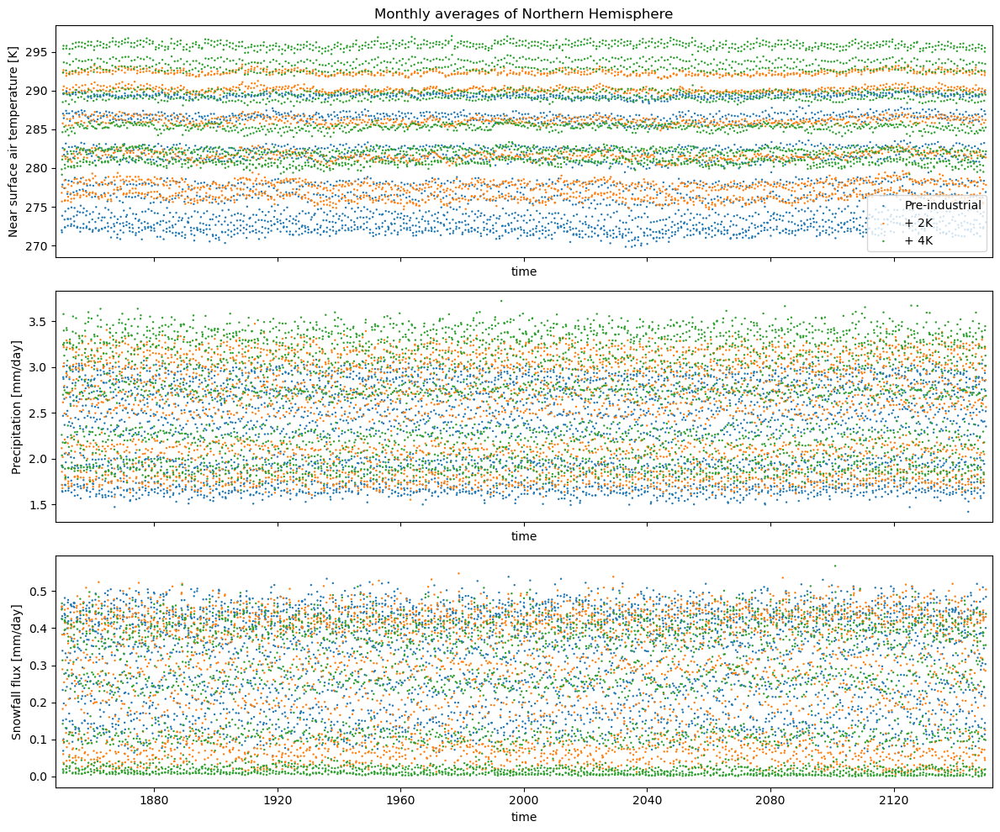

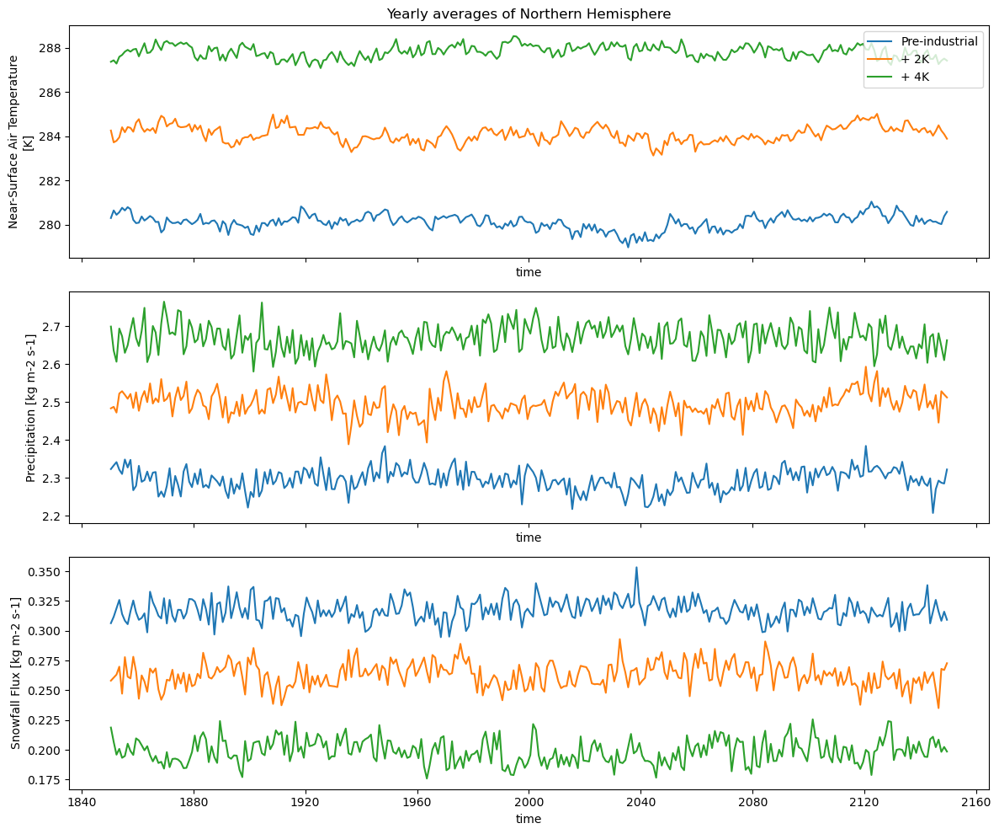

In [300]:
time_array = tas_pi.time.values
yearly_time_array = tas_pi_yearly.time.values

fig, ax = plt.subplots(3,1, figsize = (12,10), sharex = True)

tas_pi_mean.plot.scatter(x = 'time', ax = ax[0], s = 3, edgecolors = 'none', label = 'Pre-industrial')
tas_2K_mean.assign_coords(time=("time", time_array)).plot.scatter(x = 'time', ax = ax[0], s = 3, edgecolors = 'none', label = '+ 2K')
tas_4K_mean.assign_coords(time=("time", time_array)).plot.scatter(x = 'time', ax = ax[0], s = 3, edgecolors = 'none', label = '+ 4K')
ax[0].legend()
ax[0].set_title('Monthly averages of Northern Hemisphere')
ax[0].set_ylabel('Near surface air temperature [K]')

pr_pi_mean.plot.scatter(ax = ax[1], s = 3, edgecolors = 'none')
pr_2K_mean.assign_coords(time=("time", time_array)).plot.scatter(ax = ax[1], s = 3, edgecolors = 'none')
pr_4K_mean.assign_coords(time=("time", time_array)).plot.scatter(ax = ax[1], s = 3, edgecolors = 'none')
ax[1].set_ylabel('Precipitation [mm/day]')

prsn_pi_mean.plot.scatter(ax = ax[2], s = 3, edgecolors = 'none')
prsn_2K_mean.assign_coords(time=("time", time_array)).plot.scatter(ax = ax[2], s = 3, edgecolors = 'none')
prsn_4K_mean.assign_coords(time=("time", time_array)).plot.scatter(ax = ax[2], s = 3, edgecolors = 'none')
ax[2].set_ylabel('Snowfall flux [mm/day]')

plt.xlim(pd.to_datetime('1848-01-01'), pd.to_datetime('2152-01-20'))

fig.tight_layout()
plt.savefig('Monthly_averages_NH.png')

plt.show()

fig, ax = plt.subplots(3,1, figsize = (12,10), sharex = True)
tas_pi_yearly_mean.plot(x = 'time', ax = ax[0], label = 'Pre-industrial')
tas_2K_yearly_mean.assign_coords(time=("time", yearly_time_array)).plot(x = 'time', ax = ax[0], label = '+ 2K')
tas_4K_yearly_mean.assign_coords(time=("time", yearly_time_array)).plot(x = 'time', ax = ax[0], label = '+ 4K')
ax[0].legend()
ax[0].set_title('Yearly averages of Northern Hemisphere')

pr_pi_yearly_mean.plot(x = 'time', ax = ax[1])
pr_2K_yearly_mean.assign_coords(time=("time", yearly_time_array)).plot(x = 'time', ax = ax[1])
pr_4K_yearly_mean.assign_coords(time=("time", yearly_time_array)).plot(x = 'time', ax = ax[1])

prsn_pi_yearly_mean.plot(x = 'time', ax = ax[2])
prsn_2K_yearly_mean.assign_coords(time=("time", yearly_time_array)).plot(x = 'time', ax = ax[2])
prsn_4K_yearly_mean.assign_coords(time=("time", yearly_time_array)).plot(x = 'time', ax = ax[2])

fig.tight_layout()
plt.savefig('Yearly_averages_NH.png')
plt.show()



### Relative (normalized) Variablility

In [ ]:
def relative_variability(data_array):
    return data_array.std(dim = 'time')/(data_array.mean(dim = 'time'))

relative_variability_tas_pi = relative_variability(tas_pi_yearly).sel(lat = slice(60,90))

relative_variability_tas_2K = tas_2K_yearly.std(dim = 'time')/(tas_2K_yearly.mean(dim = 'time'))
relative_variability_tas_2K = relative_variability_tas_2K.sel(lat = slice(60,90))

relative_variability_tas_4K = tas_4K_yearly.std(dim = 'time')/(tas_4K_yearly.mean(dim = 'time'))
relative_variability_tas_4K = relative_variability_tas_4K.sel(lat = slice(60,90))

relative_variability_pr_pi = pr_pi_yearly.std(dim = 'time')/(pr_pi_yearly.mean(dim = 'time'))
relative_variability_pr_pi = relative_variability_pr_pi.sel(lat = slice(60,90))

relative_variability_pr_2K = pr_2K_yearly.std(dim = 'time')/(pr_2K_yearly.mean(dim = 'time'))
relative_variability_pr_2K = relative_variability_pr_2K.sel(lat = slice(60,90))

relative_variability_pr_4K = pr_4K_yearly.std(dim = 'time')/(pr_4K_yearly.mean(dim = 'time'))
relative_variability_pr_4K = relative_variability_pr_4K.sel(lat = slice(60,90))

relative_variability_prsn_pi = prsn_pi_yearly.std(dim = 'time')/(prsn_pi_yearly.mean(dim = 'time'))
relative_variability_prsn_pi = relative_variability_prsn_pi.sel(lat = slice(60,90))

relative_variability_prsn_2K = prsn_2K_yearly.std(dim = 'time')/(prsn_2K_yearly.mean(dim = 'time'))
relative_variability_prsn_2K = relative_variability_prsn_2K.sel(lat = slice(60,90))

relative_variability_prsn_4K = prsn_4K_yearly.std(dim = 'time')/(prsn_4K_yearly.mean(dim = 'time'))
relative_variability_prsn_4K = relative_variability_prsn_4K.sel(lat = slice(60,90))

relative_variability_snfr_pi = snfr_pi_yearly.std(dim = 'time')/(snfr_pi_yearly.mean(dim = 'time'))
relative_variability_snfr_pi = relative_variability_snfr_pi.sel(lat = slice(60,90))

relative_variability_snfr_2K = snfr_2K_yearly.std(dim = 'time')/(snfr_2K_yearly.mean(dim = 'time')) 
relative_variability_snfr_2K = relative_variability_snfr_2K.sel(lat = slice(60,90))

relative_variability_snfr_4K = snfr_4K_yearly.std(dim = 'time')/(snfr_4K_yearly.mean(dim = 'time'))
relative_variability_snfr_4K = relative_variability_snfr_4K.sel(lat = slice(60,90))

#### Relative (normalized) yearly variability

In [8]:
def plot_variability(variabilities, titles, savename, max_scale, bar_label, colors = 'YlOrRd'):
    fig, ax = plt.subplots(3, 1, figsize=(15, 10),
                       subplot_kw={"projection": ccrs.PlateCarree()})

    # We'll store one of the plot objects for the shared colorbar
    mesh = None
    
    for i, variability in enumerate(variabilities):
        
        # Plot without creating individual colorbars
        if max_scale == 'no_max': 
            mesh = variability.plot(
                ax=ax[i],
                transform=ccrs.PlateCarree(),
                cmap=colors,
                add_colorbar=False   # <–– important
            )
            
        else:     
            mesh = variability.plot(
                ax=ax[i],
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=max_scale,
                cmap=colors,
                add_colorbar=False   # <–– important
            )
    
        ax[i].set_title(titles[i])
        ax[i].coastlines()
        ax[i].add_feature(cfeature.BORDERS, linestyle=':')
        
        gl = ax[i].gridlines(draw_labels=True)
        gl.top_labels = False
        gl.right_labels = False
    
    # ---- Add ONE shared colorbar ----
    cbar = fig.colorbar(mesh, ax=ax, orientation='vertical', fraction=0.03, pad=0.04)
    cbar.set_label(bar_label)
    
    plt.savefig(savename)
    plt.show()



In [95]:
titles = [['Pre-industrial temperature variability (K)', '2K warming temperature variability (K)', '4K warming temperature variability (K)'],
          ['Pre-industrial presipitation variability (mm/day)', '2K warming presipitation variability (mm/day)', '4K warming presipitation variability (mm/day)'],
          ['Pre-industrial snowfall variability (mm/day)', '2K warming snowfall variability (mm/day)', '4K warming snowfall variability (mm/day)'],
          ['Pre-industrial snowfall fraction variability', '2K warming snowfall fraction variability', '4K warming snowfall fraction variability']]

# plot_variability([relative_variability_tas_pi, relative_variability_tas_2K, relative_variability_tas_4K], titles[0], 'relative_variability_tas.png', 0.015,'Temperature variability (K)')
# plot_variability([relative_variability_pr_pi, relative_variability_pr_2K, relative_variability_pr_4K], titles[1], 'relative_variability_pr.png', 0.3, 'Presipitation variability (mm/day)', 'PuBu')
# plot_variability([relative_variability_prsn_pi, relative_variability_prsn_2K, relative_variability_prsn_4K], titles[2], 'relative_variability_prsn.png', 0.7 ,'Snowfall variability (mm/day)', 'YlGnBu')
# plot_variability([relative_variability_snfr_pi, relative_variability_snfr_2K, relative_variability_snfr_4K], titles[3], 'relative_variability_snfr.png', 0.4, 'Snowfall fraction variability', 'BuGn')

#### Comparison relative (normalized) yearly variability

In [14]:
compared_relative_variability_tas_2K = relative_variability_tas_2K - relative_variability_tas_pi
compared_relative_variability_tas_4K = relative_variability_tas_4K - relative_variability_tas_pi

compared_relative_variability_pr_2K = relative_variability_pr_2K - relative_variability_pr_pi
compared_relative_variability_pr_4K = relative_variability_pr_4K - relative_variability_pr_pi

compared_relative_variability_prsn_2K = relative_variability_prsn_2K - relative_variability_prsn_pi
compared_relative_variability_prsn_4K = relative_variability_prsn_4K - relative_variability_prsn_pi

compared_relative_variability_snfr_2K = relative_variability_snfr_2K - relative_variability_snfr_pi
compared_relative_variability_snfr_4K = relative_variability_snfr_4K - relative_variability_snfr_pi

In [15]:

def plot_variability_polar(variabilities, titles, title2, savename, max_scale = 'no_max', min_scale = 0, bar_label = 'Temperature variability (K)', colors="YlOrRd", max_scale2 = 'no_max', min_scale2 = 0, colors2 = 'coolwarm'):
    proj = ccrs.NorthPolarStereo()

    # --- Figure + GridSpec layout ---
    fig = plt.figure(figsize=(10, 10))
    gs = fig.add_gridspec(2, 9)

    ax_top = fig.add_subplot(gs[0, 1:6], projection=proj)
    ax_bl = fig.add_subplot(gs[1, 0:4], projection=proj)
    ax_br = fig.add_subplot(gs[1, 4:8], projection=proj)

    axes = [ax_top, ax_bl, ax_br]

    # --- Circular clipping helper ---
    def set_circular_boundary(ax):
        theta = np.linspace(0, 2*np.pi, 100)
        center, radius = [0.5, 0.5], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T * radius + center
        circle = mpath.Path(verts)
        ax.set_boundary(circle, transform=ax.transAxes)

    # -----------------------------
    # TOP PANEL – own colorbar
    # -----------------------------
    if max_scale == "no_max":
        mesh0 = variabilities[0].plot(
            ax=ax_top,
            transform=ccrs.PlateCarree(),
            cmap=colors,
            add_colorbar=False
        )
    else:
        mesh0 = variabilities[0].plot(
            ax=ax_top,
            transform=ccrs.PlateCarree(),
            vmin=min_scale,
            vmax=max_scale,
            cmap=colors,
            add_colorbar=False
        )

    ax_top.set_title(titles[0])

    ax_top.coastlines()
    ax_top.add_feature(cfeature.BORDERS, linestyle=":")
    ax_top.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
    set_circular_boundary(ax_top)

    cbar0 = fig.colorbar(mesh0, ax=ax_top, fraction=0.035, pad=0.03)
    cbar0.set_label(bar_label)

    # ---------------------------------
    # BOTTOM TWO — shared diverging CBAR
    # ---------------------------------

    if max_scale2 == 'no_max':
        maxabs = np.nanmax(np.abs(np.concatenate([
            variabilities[1].values.flatten(),
            variabilities[2].values.flatten()
        ])))

        divnorm = mcolors.TwoSlopeNorm(vmin=-maxabs, vcenter=0, vmax=maxabs)
        max_scale2 = maxabs
        min_scale2 = -maxabs

    else:
        divnorm = mcolors.TwoSlopeNorm(vmin=min_scale2, vcenter=0, vmax=max_scale2)

    shared_mesh = None

    for ax, var, title in zip(axes[1:], variabilities[1:], titles[1:]):

        shared_mesh = var.plot(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=colors2,
            norm=divnorm,
            add_colorbar=False
        )

        ax.set_title(title)
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linestyle=":")
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        set_circular_boundary(ax)

    # --- Shared colorbar ---
    cbar_shared = fig.colorbar(
        shared_mesh,
        ax=[ax_bl, ax_br],
        fraction=0.035,
        pad=0.3,
        panchor = (-0.05, 0.5),
        orientation = 'horizontal',
        ticks = list(np.round(np.linspace(min_scale2, min_scale2/2, 2),2)) + list(np.round(np.linspace(0, max_scale2, 3),2))
    )
    cbar_shared.set_label(title2)

    # --- Final layout ---
    plt.subplots_adjust(hspace=-0.01, wspace=0.8)

    plt.savefig(savename, bbox_inches="tight", dpi=300)
    plt.show()


In [12]:
np.linspace(0,12,10)

array([ 0.        ,  1.33333333,  2.66666667,  4.        ,  5.33333333,
        6.66666667,  8.        ,  9.33333333, 10.66666667, 12.        ])

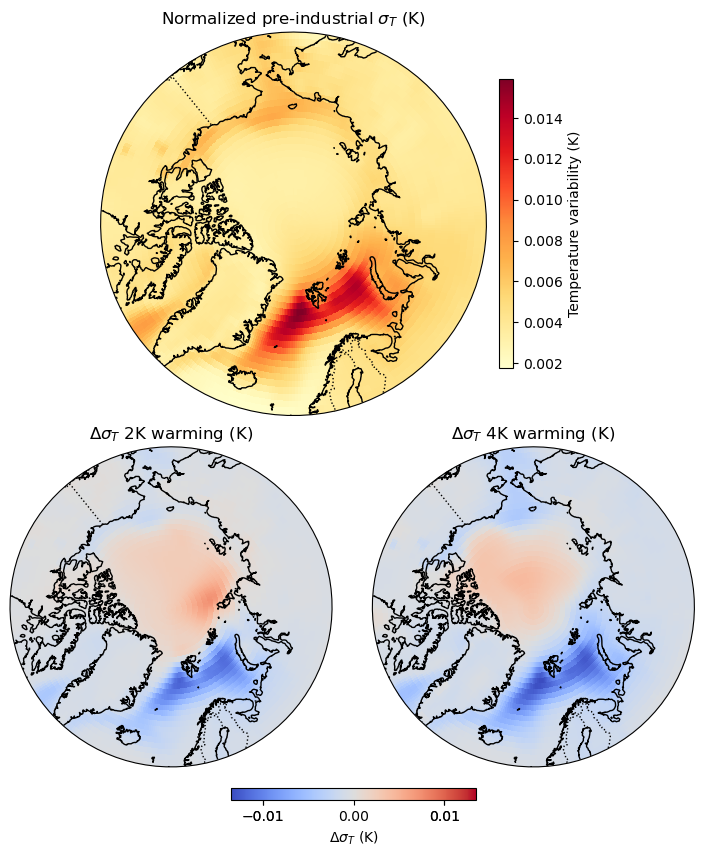

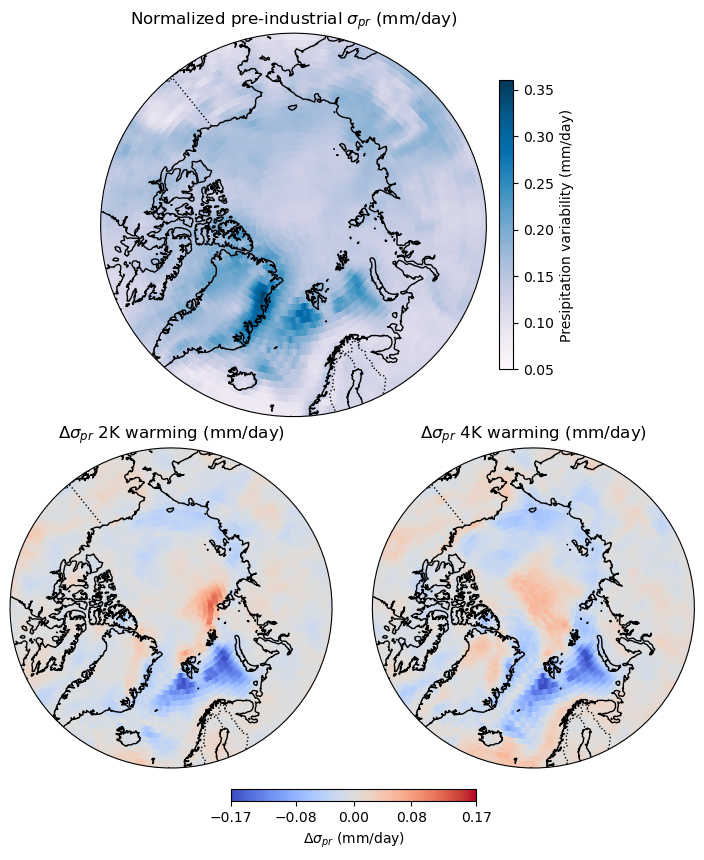

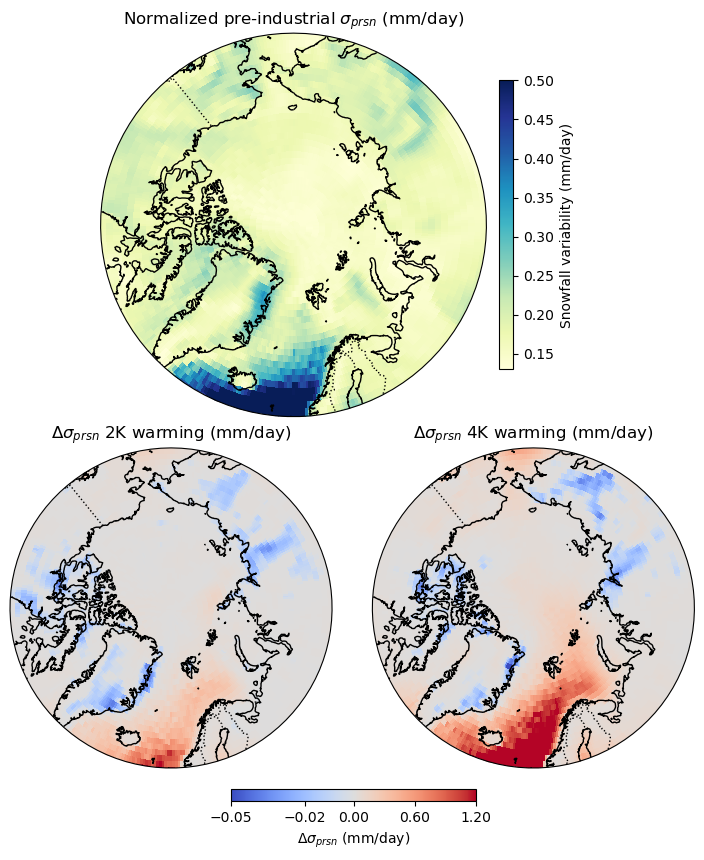

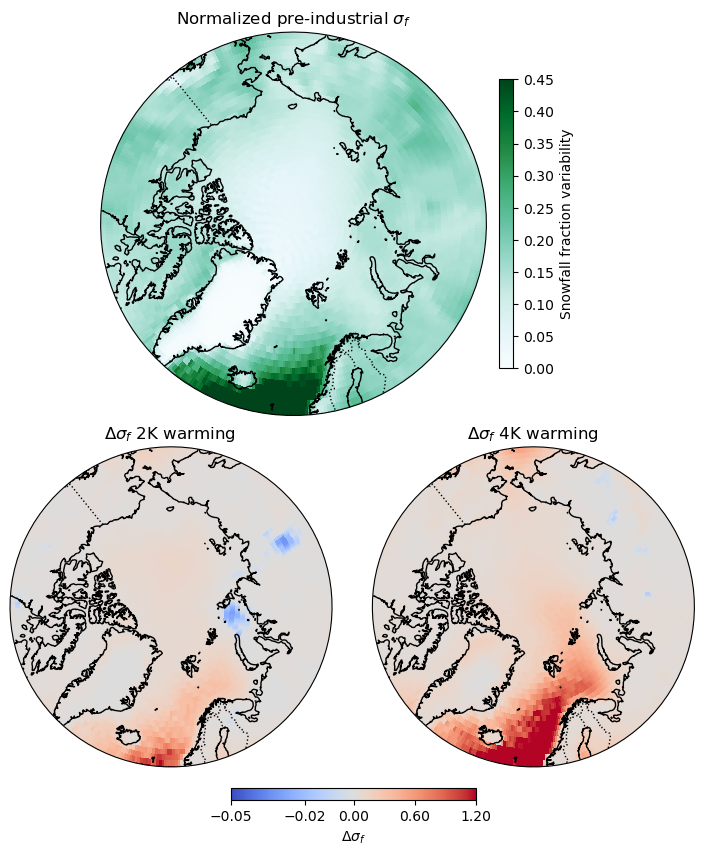

In [17]:
titles_norm_changes = [[r'Normalized pre-industrial $\sigma_{T}$ (K)', r'$\Delta \sigma_{T}$ 2K warming (K)', r'$\Delta \sigma_{T}$ 4K warming (K)'],
          [r'Normalized pre-industrial $\sigma_{pr}$ (mm/day)', r'$\Delta \sigma_{pr}$ 2K warming (mm/day)', r'$\Delta \sigma_{pr}$ 4K warming (mm/day)'],
          [r'Normalized pre-industrial $\sigma_{prsn}$ (mm/day)', r'$\Delta \sigma_{prsn}$ 2K warming (mm/day)', r'$\Delta \sigma_{prsn}$ 4K warming (mm/day)'],
          [r'Normalized pre-industrial $\sigma_{f}$', r'$\Delta \sigma_{f}$ 2K warming ', r'$\Delta \sigma_{f}$ 4K warming']]


plot_variability_polar([relative_variability_tas_pi, compared_relative_variability_tas_2K, compared_relative_variability_tas_4K], titles_norm_changes[0], r'$\Delta \sigma_{T}$ (K)', 'comparison_relative_variability_tas.png', 'no_max', 0,'Temperature variability (K)')
plot_variability_polar([relative_variability_pr_pi, compared_relative_variability_pr_2K, compared_relative_variability_pr_4K], titles_norm_changes[1], r'$\Delta \sigma_{pr}$ (mm/day)', 'comparison_relative_variability_pr.png', 0.36, 0.05,'Presipitation variability (mm/day)', 'PuBu', 0.17, -0.17)
plot_variability_polar([relative_variability_prsn_pi, compared_relative_variability_prsn_2K, compared_relative_variability_prsn_4K], titles_norm_changes[2], r'$\Delta \sigma_{prsn}$ (mm/day)', 'comparison_relative_variability_prsn.png', 0.5, 0.13,'Snowfall variability (mm/day)', 'YlGnBu', 1.2,-0.05)
plot_variability_polar([relative_variability_snfr_pi, compared_relative_variability_snfr_2K, compared_relative_variability_snfr_4K], titles_norm_changes[3], r'$\Delta \sigma_{f}$', 'comparison_relative_variability_snfr.png', 0.45, 0,'Snowfall fraction variability', 'BuGn', 1.2, -0.05)

#### Calculating contributions to snowfall variability

In [266]:
# Same data handeling as in function for obtaining snow fraction to not 
def new_pr_and_prsn(pr, prsn):
    pr_new = pr.where(pr >= 0)
    prsn_new = prsn.where(pr >= 0)
    
    prsn_new = prsn.where(prsn_new >= 0, 0)
    
    difference = pr_new-prsn_new
    prsn_overshot = difference.where(difference < 0, 0)
    print(prsn_overshot.min().values)
    prsn_new = prsn_new + prsn_overshot # make it so snowfall cannot be larger than precipitation
    return pr_new, prsn_new

# creating corrected data arrays
corrected_pr_pi, corrected_prsn_pi = new_pr_and_prsn(pr_pi_yearly, prsn_pi_yearly)
corrected_pr_2K, corrected_prsn_2K = new_pr_and_prsn(pr_2K_yearly, prsn_2K_yearly)
corrected_pr_4K, corrected_prsn_4K = new_pr_and_prsn(pr_4K_yearly, prsn_4K_yearly)

# calculating the means
mean_snfr_pi = snfr_pi_yearly.mean(dim = 'time')
mean_pr_pi = pr_pi_yearly.mean(dim = 'time')
mean_snfr_2K = snfr_2K_yearly.mean(dim = 'time')
mean_pr_2k = pr_2K_yearly.mean(dim = 'time')
mean_snfr_4K = snfr_4K_yearly.mean(dim = 'time')
mean_pr_4K = pr_4K_yearly.mean(dim = 'time')

corrected_mean_pr_pi = corrected_pr_pi.mean(dim = 'time')
corrected_mean_pr_2K = corrected_pr_pi.mean(dim = 'time')
corrected_mean_pr_4K = corrected_pr_pi.mean(dim = 'time')

corrected_mean_prsn_pi = corrected_prsn_pi.mean(dim = 'time')
corrected_mean_prsn_2K = corrected_prsn_pi.mean(dim = 'time')
corrected_mean_prsn_4K = corrected_prsn_pi.mean(dim = 'time')

# calculating the variability
corrected_variability_pr_pi = corrected_pr_pi.std(dim = 'time').sel(lat = slice(20,90))
corrected_variability_prsn_pi = corrected_prsn_pi.std(dim = 'time').sel(lat = slice(20,90))

corrected_variability_pr_2K = corrected_pr_2K.std(dim = 'time').sel(lat = slice(20,90))
corrected_variability_prsn_2K = corrected_prsn_2K.std(dim = 'time').sel(lat = slice(20,90))

corrected_variability_pr_4K = corrected_pr_4K.std(dim = 'time').sel(lat = slice(20,90))
corrected_variability_prsn_4K = corrected_prsn_4K.std(dim = 'time').sel(lat = slice(20,90))

# calculating the relative (normalized variability)
corrected_relative_variability_pr_pi = corrected_pr_pi.std(dim = 'time').sel(lat = slice(20,90))/corrected_mean_pr_pi
corrected_relative_variability_prsn_pi = corrected_prsn_pi.std(dim = 'time').sel(lat = slice(20,90))/corrected_mean_prsn_pi

corrected_relative_variability_pr_2K = corrected_pr_2K.std(dim = 'time').sel(lat = slice(20,90))/corrected_mean_pr_2K
corrected_relative_variability_prsn_2K = corrected_prsn_2K.std(dim = 'time').sel(lat = slice(20,90))/corrected_mean_prsn_2K

corrected_relative_variability_pr_4K = corrected_pr_4K.std(dim = 'time').sel(lat = slice(20,90))/corrected_mean_pr_4K
corrected_relative_variability_prsn_4K = corrected_prsn_4K.std(dim = 'time').sel(lat = slice(20,90))/corrected_mean_prsn_4K


#covariance
covariance_pi = xr.cov(snfr_pi_yearly, pr_pi_yearly, dim = 'time')
covariance_2K = xr.cov(snfr_2K_yearly, pr_2K_yearly, dim = 'time')
covariance_4K = xr.cov(snfr_4K_yearly, pr_4K_yearly, dim = 'time')

corrected_covariance_pi = xr.cov(snfr_pi_yearly, corrected_pr_pi, dim = 'time')
corrected_covariance_2K = xr.cov(snfr_2K_yearly, corrected_pr_2K, dim = 'time')
corrected_covariance_4K = xr.cov(snfr_4K_yearly, corrected_pr_4K, dim = 'time')


# variabilities calculated from uncorrected detrended data
variability_prsn_pi_squared = variability_prsn_pi**2
calculated_variability_prsn_pi_squared = variability_snfr_pi**2 * mean_pr_pi**2 + variability_pr_pi**2 * mean_snfr_pi**2 +  variability_snfr_pi**2 * variability_pr_pi**2

# variabilities calculated from corrected detrended data
corrected_variability_prsn_pi_squared = corrected_variability_prsn_pi**2
corrected_calculated_variability_prsn_pi_squared = variability_snfr_pi**2 * corrected_mean_pr_pi**2 + corrected_variability_pr_pi**2 * mean_snfr_pi**2 +  variability_snfr_pi**2 * corrected_variability_pr_pi**2

# without the covariance term
other_calculated = variability_snfr_pi**2 * corrected_mean_pr_pi**2 + corrected_variability_pr_pi**2 * mean_snfr_pi**2

diff_corrected_uncorrected = corrected_variability_prsn_pi_squared - variability_prsn_pi_squared

diff_sig2 = calculated_variability_prsn_pi_squared - variability_prsn_pi_squared
corrected_diff_sig2 = corrected_calculated_variability_prsn_pi_squared - corrected_variability_prsn_pi_squared
meta_diff = corrected_diff_sig2 - diff_sig2
other_diff = other_calculated - corrected_variability_prsn_pi_squared

corrected_cov_diff = corrected_sigma2_pi_cov - corrected_variability_prsn_pi_squared
cov_diff = sigma2_pi_cov - variability_prsn_pi_squared

-0.00011759441192832343
-0.0001282630615855318
-9.063604759829147e-05


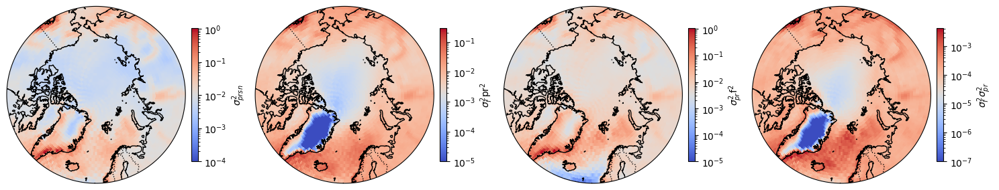

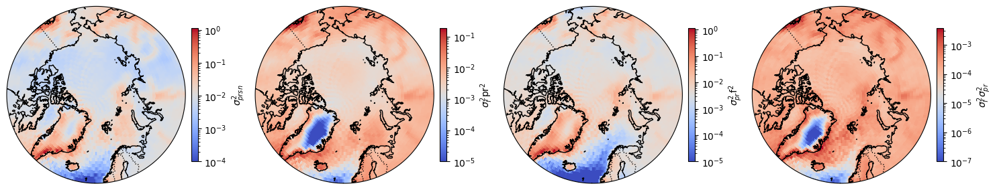

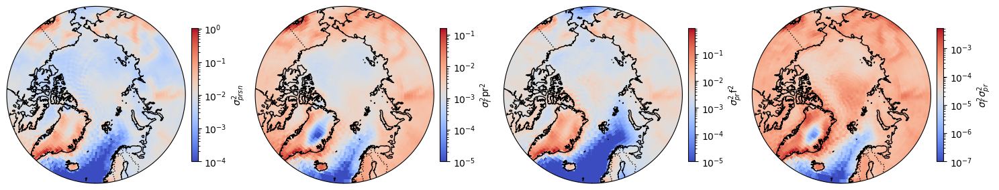

In [267]:
proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,4, figsize=(18, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(corrected_variability_prsn_pi**2, r'$\sigma_{prsn}^2$', cbar_scale = 'log', linthresh = 1e-4, min_scale = 0.0001, ax = ax[0], fig = fig)
standard_2d_plot_polar(variability_snfr_pi**2 * corrected_mean_pr_pi**2 , r'$\sigma_{f}^2$pr$^2$', cbar_scale = 'log', linthresh = 1e-3, min_scale = 1e-5, ax = ax[1], fig = fig)
standard_2d_plot_polar(corrected_variability_pr_pi**2 * mean_snfr_pi**2 , r'$\sigma_{pr}^2$f$^2$', cbar_scale = 'log', linthresh = 1e-7, min_scale = 1e-5, ax = ax[2], fig = fig)
standard_2d_plot_polar(variability_snfr_pi**2 * corrected_variability_pr_pi**2, r'$\sigma_{f}^2$$\sigma_{pr}^2$', cbar_scale = 'log', linthresh = 1e-7, min_scale = 1e-7, ax = ax[3], fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,4, figsize=(18, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(corrected_variability_prsn_2K**2, r'$\sigma_{prsn}^2$', cbar_scale = 'log', linthresh = 1e-4, min_scale = 0.0001, ax = ax[0], fig = fig)
standard_2d_plot_polar(variability_snfr_2K**2 * corrected_mean_pr_2K**2 , r'$\sigma_{f}^2$pr$^2$', cbar_scale = 'log', linthresh = 1e-3, min_scale = 1e-5, ax = ax[1], fig = fig)
standard_2d_plot_polar(corrected_variability_pr_2K**2 * mean_snfr_2K**2 , r'$\sigma_{pr}^2$f$^2$', cbar_scale = 'log', linthresh = 1e-7, min_scale = 1e-5, ax = ax[2], fig = fig)
standard_2d_plot_polar(variability_snfr_2K**2 * corrected_variability_pr_2K**2, r'$\sigma_{f}^2$$\sigma_{pr}^2$', cbar_scale = 'log', linthresh = 1e-7, min_scale = 1e-7, ax = ax[3], fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,4, figsize=(18, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(corrected_variability_prsn_4K**2, r'$\sigma_{prsn}^2$', cbar_scale = 'log', linthresh = 1e-4, min_scale = 0.0001, ax = ax[0], fig = fig)
standard_2d_plot_polar(variability_snfr_4K**2 * corrected_mean_pr_4K**2 , r'$\sigma_{f}^2$pr$^2$', cbar_scale = 'log', linthresh = 1e-3, min_scale = 1e-5, ax = ax[1], fig = fig)
standard_2d_plot_polar(corrected_variability_pr_4K**2 * mean_snfr_4K**2 , r'$\sigma_{pr}^2$f$^2$', cbar_scale = 'log', linthresh = 1e-7, min_scale = 1e-5, ax = ax[2], fig = fig)
standard_2d_plot_polar(variability_snfr_4K**2 * corrected_variability_pr_4K**2, r'$\sigma_{f}^2$$\sigma_{pr}^2$', cbar_scale = 'log', linthresh = 1e-7, min_scale = 1e-7, ax = ax[3], fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

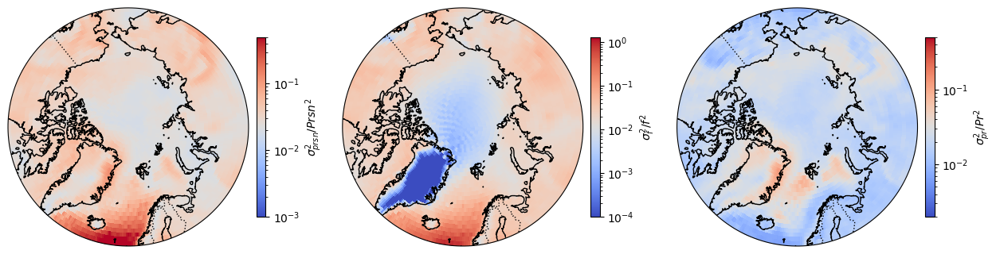

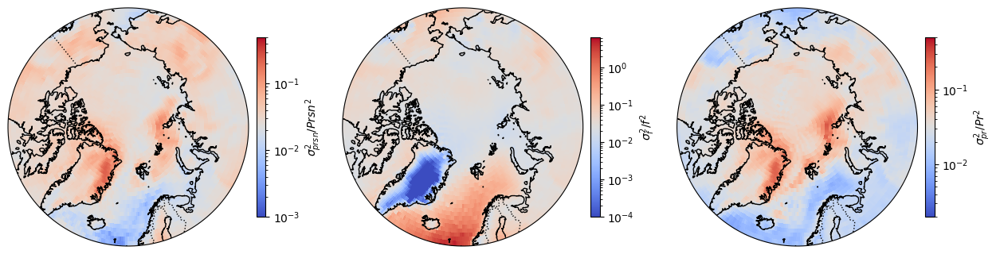

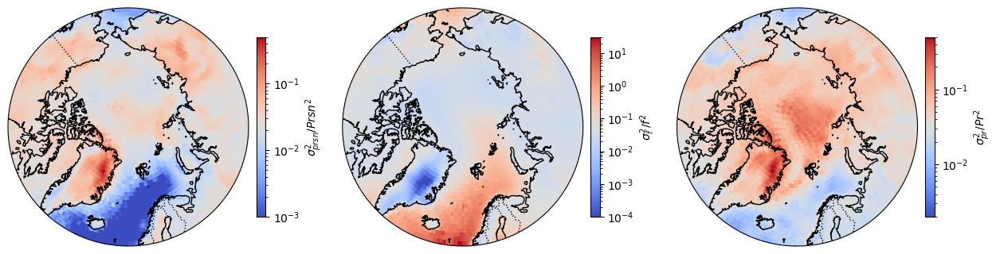

In [231]:
proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,3, figsize=(15, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(corrected_relative_variability_prsn_pi**2, r'$\sigma_{prsn}^2/Prsn^2$', cbar_scale = 'log', min_scale = 0.001, max_scale = 0.5,ax = ax[0], fig = fig)
standard_2d_plot_polar(relative_variability_snfr_pi**2, r'$\sigma_{f}^2/f^2$', cbar_scale = 'log', min_scale = 1e-4, ax = ax[1], fig = fig)
standard_2d_plot_polar(corrected_relative_variability_pr_pi**2, r'$\sigma_{pr}^2/Pr^2$', cbar_scale = 'log', min_scale = 0.002, ax = ax[2], max_scale = 0.5, fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,3, figsize=(15, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(corrected_relative_variability_prsn_2K**2, r'$\sigma_{prsn}^2/Prsn^2$', cbar_scale = 'log', min_scale = 0.001, max_scale = 0.5,ax = ax[0], fig = fig)
standard_2d_plot_polar(relative_variability_snfr_2K**2, r'$\sigma_{f}^2/f^2$', cbar_scale = 'log', min_scale = 1e-4, ax = ax[1], fig = fig)
standard_2d_plot_polar(corrected_relative_variability_pr_2K**2, r'$\sigma_{pr}^2/Pr^2$', cbar_scale = 'log', min_scale = 0.002, ax = ax[2], max_scale = 0.5, fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,3, figsize=(15, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(corrected_relative_variability_prsn_4K**2, r'$\sigma_{prsn}^2/Prsn^2$', cbar_scale = 'log', min_scale = 0.001, max_scale = 0.5,ax = ax[0], fig = fig)
standard_2d_plot_polar(relative_variability_snfr_4K**2, r'$\sigma_{f}^2/f^2$', cbar_scale = 'log', min_scale = 1e-4, ax = ax[1], fig = fig)
standard_2d_plot_polar(corrected_relative_variability_pr_4K**2, r'$\sigma_{pr}^2/Pr^2$', cbar_scale = 'log', min_scale = 0.002, ax = ax[2], max_scale = 0.5, fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

In [ ]:
proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,3, figsize=(15, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(corrected_relative_variability_prsn_pi**2, r'$\sigma_{prsn}^2/Prsn^2$', cbar_scale = 'log', min_scale = 0.008, max_scale = 1,ax = ax[0], fig = fig)
standard_2d_plot_polar(relative_variability_snfr_pi**2 / corrected_relative_variability_prsn_pi**2, r'$\sigma_{f}^2/f^2$', cbar_scale = 'log', min_scale = 1e-4, ax = ax[1], fig = fig)
standard_2d_plot_polar(corrected_relative_variability_pr_pi**2 / corrected_relative_variability_prsn_pi**2, r'$\sigma_{pr}^2/Pr^2$', cbar_scale = 'log', min_scale = 0.01, ax = ax[2], fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

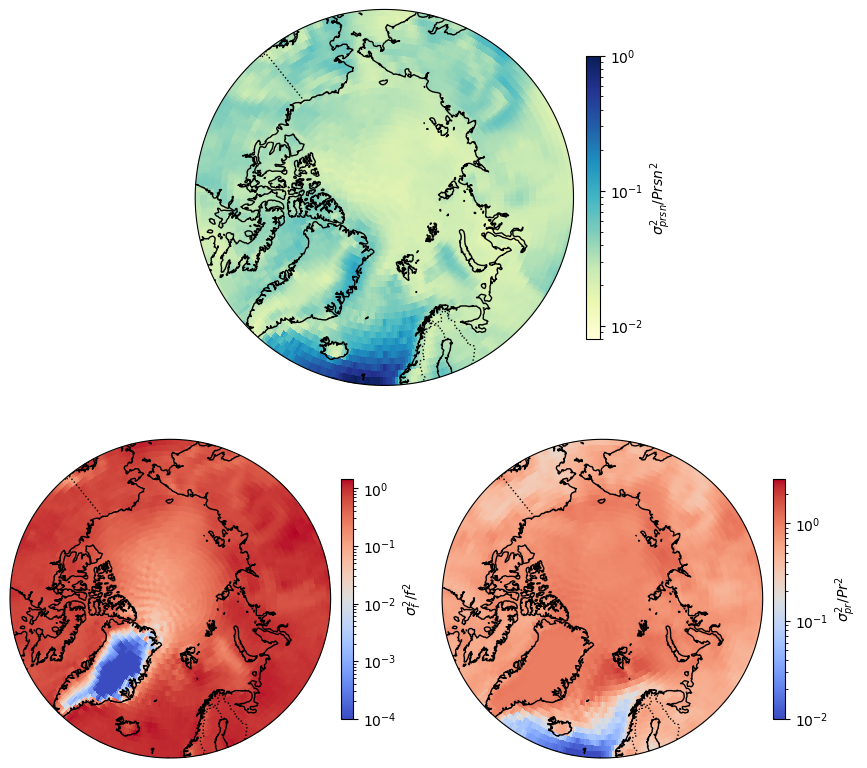

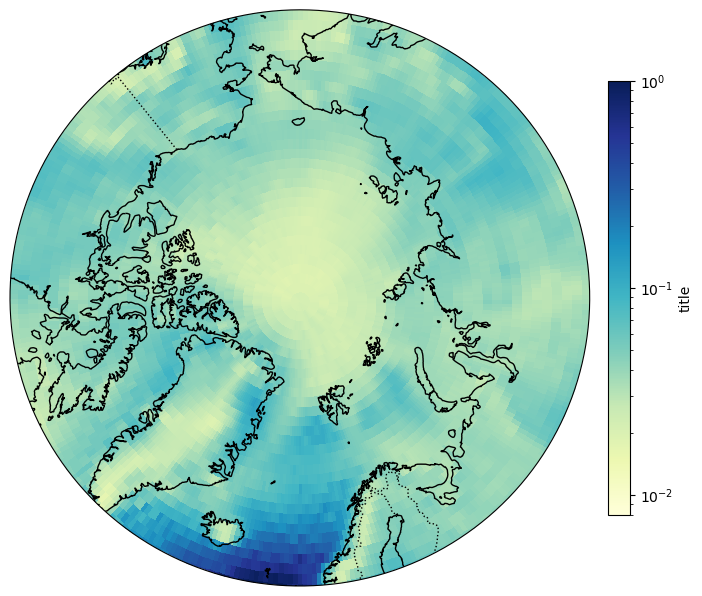

In [198]:
proj = ccrs.NorthPolarStereo(central_longitude=0)
fig = plt.figure(figsize=(10, 11))
gs = fig.add_gridspec(2, 13)

ax_top = fig.add_subplot(gs[0, 3:10], projection=proj)
ax_bl = fig.add_subplot(gs[1, 0:6], projection=proj)
ax_br = fig.add_subplot(gs[1, 7:13], projection=proj)

standard_2d_plot_polar(corrected_relative_variability_prsn_pi**2, r'$\sigma_{prsn}^2/Prsn^2$', cbar_scale = 'log', min_scale = 0.008, max_scale = 1,ax = ax_top, fig = fig, color = 'YlGnBu')
standard_2d_plot_polar(relative_variability_snfr_pi**2 / corrected_relative_variability_prsn_pi**2, r'$\sigma_{f}^2/f^2$', cbar_scale = 'log', min_scale = 1e-4, ax = ax_bl, fig = fig)
standard_2d_plot_polar(corrected_relative_variability_pr_pi**2 / corrected_relative_variability_prsn_pi**2, r'$\sigma_{pr}^2/Pr^2$', cbar_scale = 'log', min_scale = 0.01, ax = ax_br, fig = fig)
plt.subplots_adjust(hspace=-0.1, wspace=0.8)
plt.show()

standard_2d_plot_polar(relative_variability_snfr_pi**2 + corrected_relative_variability_pr_pi**2, cbar_scale = 'log', min_scale = 0.008, max_scale = 1, color = 'YlGnBu')

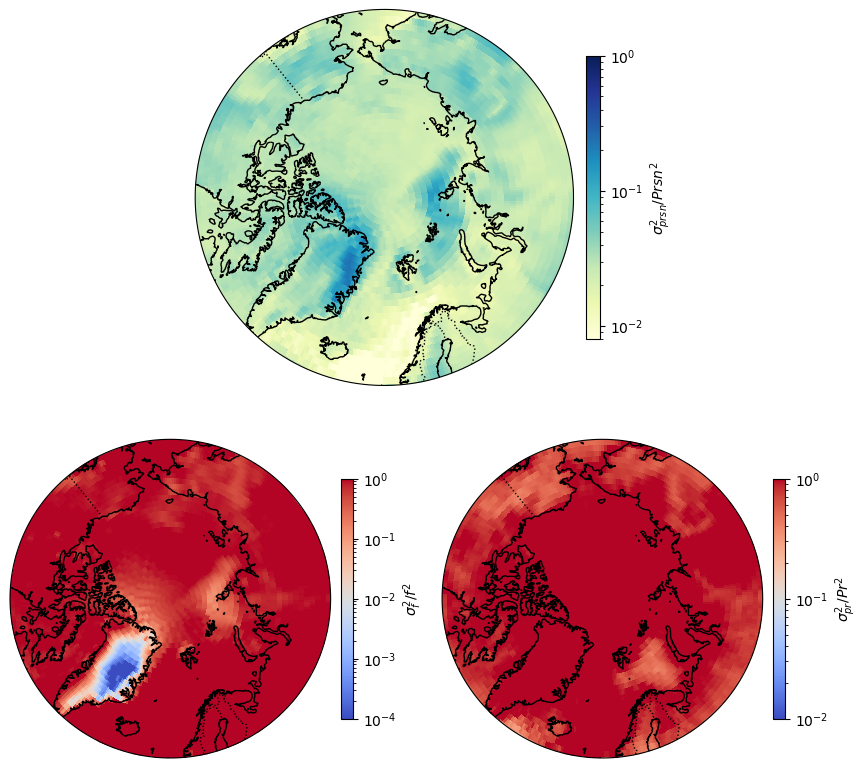

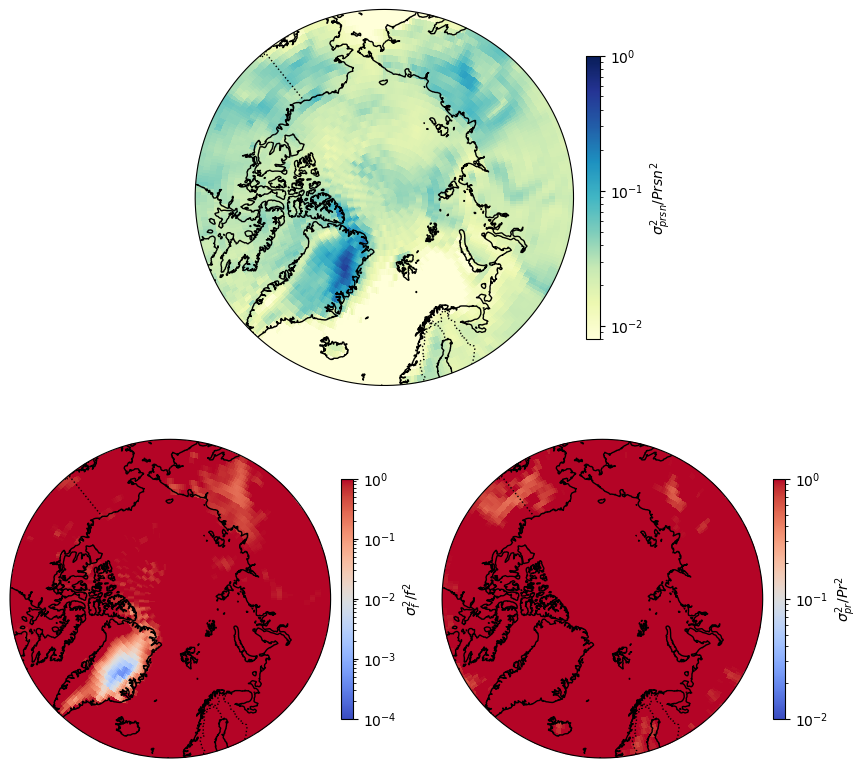

In [196]:
proj = ccrs.NorthPolarStereo(central_longitude=0)
fig = plt.figure(figsize=(10, 11))
gs = fig.add_gridspec(2, 13)

ax_top = fig.add_subplot(gs[0, 3:10], projection=proj)
ax_bl = fig.add_subplot(gs[1, 0:6], projection=proj)
ax_br = fig.add_subplot(gs[1, 7:13], projection=proj)

standard_2d_plot_polar(corrected_relative_variability_prsn_2K**2, r'$\sigma_{prsn}^2/Prsn^2$', cbar_scale = 'log', min_scale = 0.008, max_scale = 1,ax = ax_top, fig = fig, color = 'YlGnBu')
standard_2d_plot_polar(relative_variability_snfr_2K**2 / corrected_relative_variability_prsn_2K**2, r'$\sigma_{f}^2/f^2$', cbar_scale = 'log', min_scale = 1e-4, max_scale = 1, ax = ax_bl, fig = fig)
standard_2d_plot_polar(corrected_relative_variability_pr_2K**2 / corrected_relative_variability_prsn_2K**2, r'$\sigma_{pr}^2/Pr^2$', cbar_scale = 'log', min_scale = 0.01, max_scale = 1, ax = ax_br, fig = fig)
plt.subplots_adjust(hspace=-0.1, wspace=0.8)
plt.show()


proj = ccrs.NorthPolarStereo(central_longitude=0)
fig = plt.figure(figsize=(10, 11))
gs = fig.add_gridspec(2, 13)

ax_top = fig.add_subplot(gs[0, 3:10], projection=proj)
ax_bl = fig.add_subplot(gs[1, 0:6], projection=proj)
ax_br = fig.add_subplot(gs[1, 7:13], projection=proj)

standard_2d_plot_polar(corrected_relative_variability_prsn_4K**2, r'$\sigma_{prsn}^2/Prsn^2$', cbar_scale = 'log', min_scale = 0.008, max_scale = 1,ax = ax_top, fig = fig, color = 'YlGnBu')
standard_2d_plot_polar(relative_variability_snfr_4K**2 / corrected_relative_variability_prsn_4K**2, r'$\sigma_{f}^2/f^2$', cbar_scale = 'log', min_scale = 1e-4, max_scale = 1, ax = ax_bl, fig = fig)
standard_2d_plot_polar(corrected_relative_variability_pr_4K**2 / corrected_relative_variability_prsn_4K**2, r'$\sigma_{pr}^2/Pr^2$', cbar_scale = 'log', min_scale = 0.01, max_scale = 1, ax = ax_br, fig = fig)
plt.subplots_adjust(hspace=-0.1, wspace=0.8)
plt.show()

### Variability

#### Yearly variability

In [269]:
variability_prsn_pi = prsn_pi_yearly.std(dim = 'time')
variability_prsn_pi = variability_prsn_pi.sel(lat = slice(20,90))


variability_detrended_prsn_pi = detrended_prsn_pi_yearly.std(dim = 'time')
variability_detrended_prsn_pi = variability_detrended_prsn_pi.sel(lat = slice(20,90))

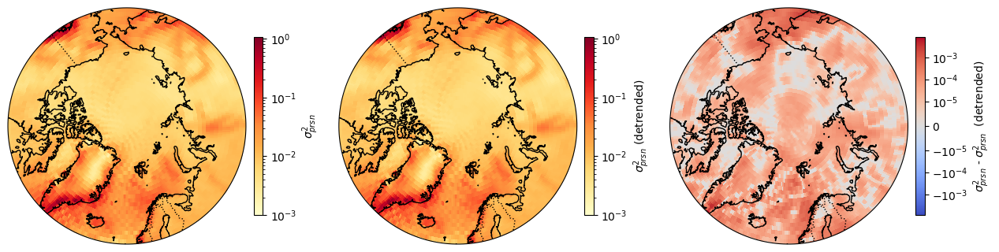

In [281]:
proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,3, figsize=(15, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(variability_prsn_pi**2, r'$\sigma_{prsn}^2$', cbar_scale = 'log', color = "YlOrRd", min_scale = 0.001, ax = ax[0], fig = fig)
standard_2d_plot_polar(variability_detrended_prsn_pi**2, r'$\sigma_{prsn}^2$ (detrended)', cbar_scale = 'log', color = "YlOrRd", min_scale = 0.001, ax = ax[1], fig = fig)
standard_2d_plot_polar(variability_prsn_pi**2 - variability_detrended_prsn_pi**2, r'$\sigma_{prsn}^2$ - $\sigma_{prsn}^2$  (detrended)', cbar_scale = 'symlog',  linthresh = 1e-5, ax = ax[2], fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()


In [93]:
# plot_variability([variability_tas_pi, variability_tas_2K, variability_tas_4K], titles[0], 'variability_tas.png', 'no_max','Temperature variability (K)')
# plot_variability([variability_pr_pi, variability_pr_2K, variability_pr_4K], titles[1], 'variability_pr.png',  'no_max', 'Presipitation variability (mm/day)', 'PuBu')
# plot_variability([variability_prsn_pi, variability_prsn_2K, variability_prsn_4K], titles[2], 'variability_prsn.png',  0.6,'Snowfall variability (mm/day)', 'YlGnBu')
# plot_variability([variability_snfr_pi, variability_snfr_2K, variability_snfr_4K], titles[3], 'variability_snfr.png',  0.15, 'Snowfall fraction variability', 'BuGn')

#### Comparison yearly variability

In [20]:
compared_variability_tas_2K = variability_tas_2K - variability_tas_pi
compared_variability_tas_4K = variability_tas_4K - variability_tas_pi

compared_variability_pr_2K = variability_pr_2K - variability_pr_pi
compared_variability_pr_4K = variability_pr_4K - variability_pr_pi

compared_variability_prsn_2K = variability_prsn_2K - variability_prsn_pi
compared_variability_prsn_4K = variability_prsn_4K - variability_prsn_pi

compared_variability_snfr_2K = variability_snfr_2K - variability_snfr_pi
compared_variability_snfr_4K = variability_snfr_4K - variability_snfr_pi

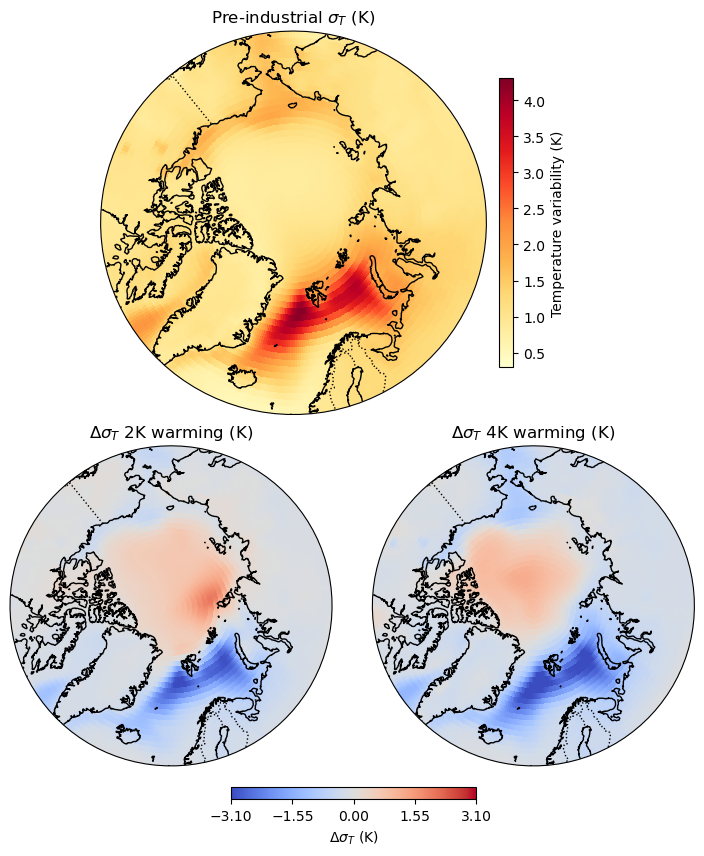

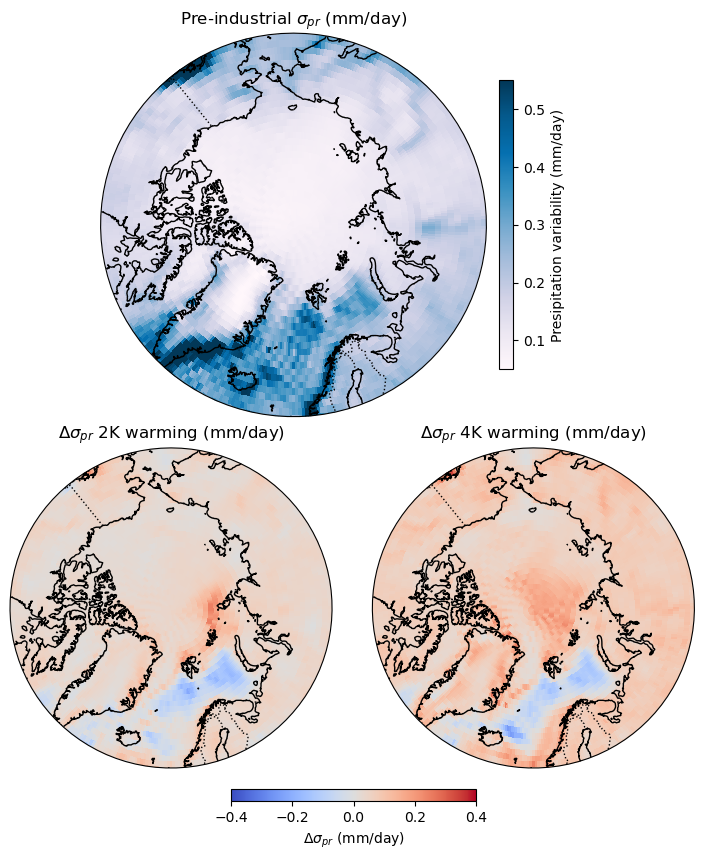

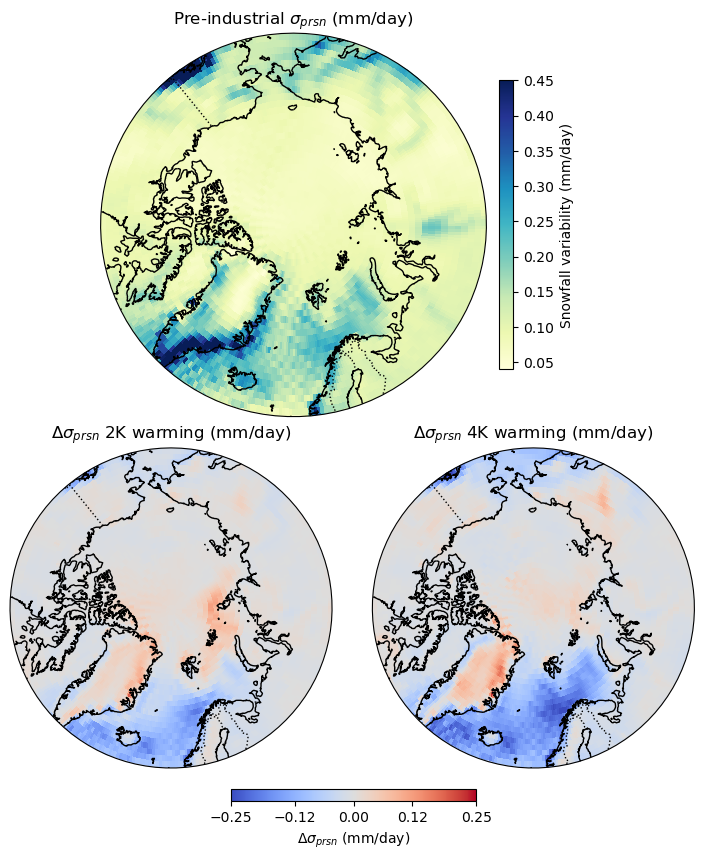

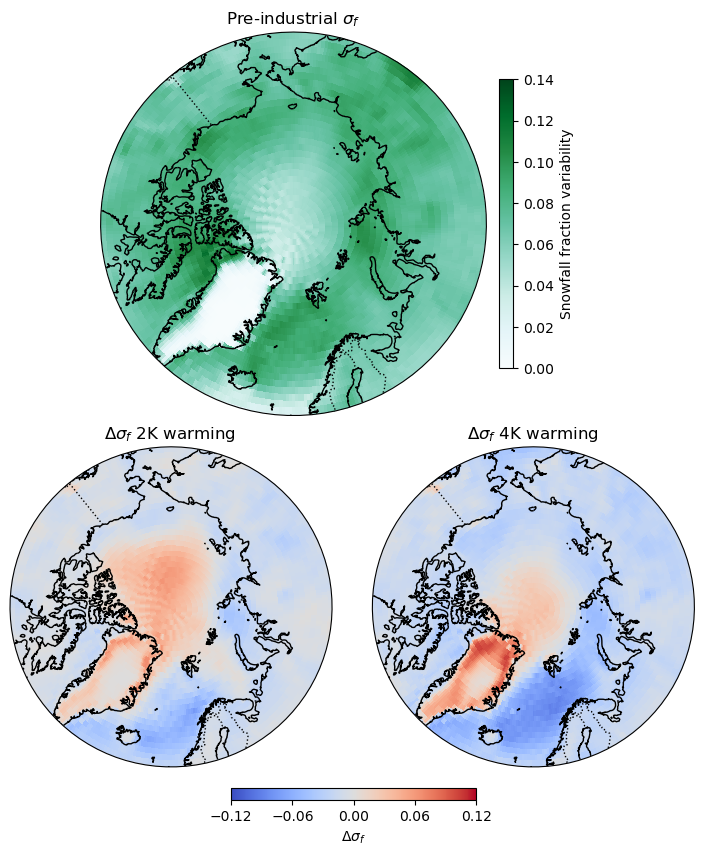

In [29]:
titles_changes = [[r'Pre-industrial $\sigma_{T}$ (K)', r'$\Delta \sigma_{T}$ 2K warming (K)', r'$\Delta \sigma_{T}$ 4K warming (K)'],
          [r'Pre-industrial $\sigma_{pr}$ (mm/day)', r'$\Delta \sigma_{pr}$ 2K warming (mm/day)', r'$\Delta \sigma_{pr}$ 4K warming (mm/day)'],
          [r'Pre-industrial $\sigma_{prsn}$ (mm/day)', r'$\Delta \sigma_{prsn}$ 2K warming (mm/day)', r'$\Delta \sigma_{prsn}$ 4K warming (mm/day)'],
          [r'Pre-industrial $\sigma_{f}$', r'$\Delta \sigma_{f}$ 2K warming ', r'$\Delta \sigma_{f}$ 4K warming']]

plot_variability_polar([variability_tas_pi, compared_variability_tas_2K, compared_variability_tas_4K], titles_changes[0], r'$\Delta \sigma_{T}$ (K)', 'comparison_variability_tas.png', 4.3, 0.3,'Temperature variability (K)', max_scale2 = 3.1, min_scale2 = -3.1)
plot_variability_polar([variability_pr_pi, compared_variability_pr_2K, compared_variability_pr_4K], titles_changes[1], r'$\Delta \sigma_{pr}$ (mm/day)', 'comparison_variability_pr.png', 0.55, 0.05,'Presipitation variability (mm/day)', 'PuBu', 0.4, -0.4)
plot_variability_polar([variability_prsn_pi, compared_variability_prsn_2K, compared_variability_prsn_4K], titles_changes[2], r'$\Delta \sigma_{prsn}$ (mm/day)', 'comparison_variability_prsn.png', 0.45, 0.04,'Snowfall variability (mm/day)', 'YlGnBu', 0.25, -0.25)
plot_variability_polar([variability_snfr_pi, compared_variability_snfr_2K, compared_variability_snfr_4K], titles_changes[3], r'$\Delta \sigma_{f}$', 'comparison_variability_snfr.png', 0.14, 0,'Snowfall fraction variability', 'BuGn', 0.12, -0.12)

#### Comparing model output and calculated variability

In [236]:
# Same data handeling as in function for obtaining snow fraction to not 
def new_pr_and_prsn(pr, prsn):
    pr_new = pr.where(pr >= 0)
    prsn_new = prsn.where(pr >= 0)
    
    prsn_new = prsn.where(prsn_new >= 0, 0)
    
    difference = pr_new-prsn_new
    prsn_overshot = difference.where(difference < 0, 0)
    print(prsn_overshot.min().values)
    prsn_new = prsn_new + prsn_overshot # make it so snowfall cannot be larger than precipitation
    return pr_new, prsn_new

corrected_pr_pi, corrected_prsn_pi = new_pr_and_prsn(pr_pi_yearly, prsn_pi_yearly)

corrected_variability_pr_pi = corrected_pr_pi.std(dim = 'time')
corrected_variability_pr_pi = corrected_variability_pr_pi.sel(lat = slice(20,90))

corrected_variability_prsn_pi = corrected_prsn_pi.std(dim = 'time')
corrected_variability_prsn_pi = corrected_variability_prsn_pi.sel(lat = slice(20,90))

# means
mean_snfr_pi = snfr_pi_yearly.mean(dim = 'time')
mean_pr_pi = pr_pi_yearly.mean(dim = 'time')

corrected_mean_pr_pi = corrected_pr_pi.mean(dim = 'time')

#covariance
covariance_pi = xr.cov(snfr_pi_yearly, pr_pi_yearly, dim = 'time')

corrected_covariance_pi = xr.cov(snfr_pi_yearly, corrected_pr_pi, dim = 'time')


# variabilities calculated from uncorrected detrended data
variability_prsn_pi_squared = variability_prsn_pi**2
calculated_variability_prsn_pi_squared = variability_snfr_pi**2 * mean_pr_pi**2 + variability_pr_pi**2 * mean_snfr_pi**2 +  variability_snfr_pi**2 * variability_pr_pi**2

# variabilities calculated from corrected detrended data
corrected_variability_prsn_pi_squared = corrected_variability_prsn_pi**2
corrected_calculated_variability_prsn_pi_squared = variability_snfr_pi**2 * corrected_mean_pr_pi**2 + corrected_variability_pr_pi**2 * mean_snfr_pi**2 +  variability_snfr_pi**2 * corrected_variability_pr_pi**2

# without the covariance term
other_calculated = variability_snfr_pi**2 * corrected_mean_pr_pi**2 + corrected_variability_pr_pi**2 * mean_snfr_pi**2

diff_corrected_uncorrected = corrected_variability_prsn_pi_squared - variability_prsn_pi_squared

diff_sig2 = calculated_variability_prsn_pi_squared - variability_prsn_pi_squared
corrected_diff_sig2 = corrected_calculated_variability_prsn_pi_squared - corrected_variability_prsn_pi_squared
meta_diff = corrected_diff_sig2 - diff_sig2
other_diff = other_calculated - corrected_variability_prsn_pi_squared

corrected_cov_diff = corrected_sigma2_pi_cov - corrected_variability_prsn_pi_squared
cov_diff = sigma2_pi_cov - variability_prsn_pi_squared

-0.00011759441192832343


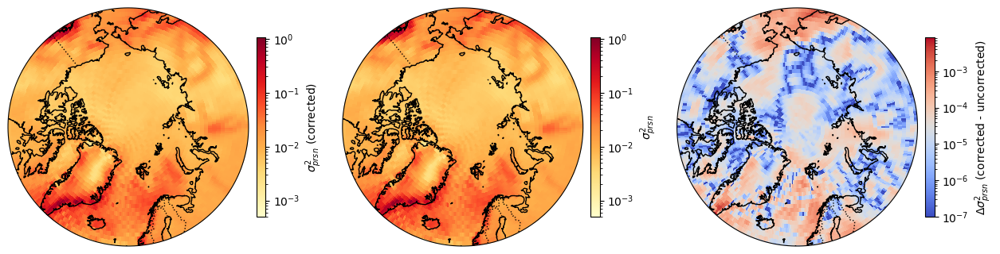

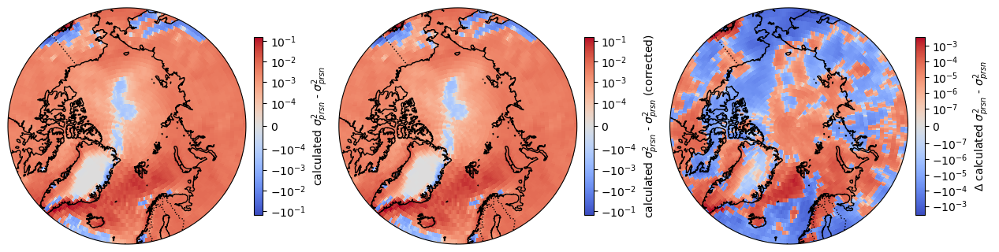

In [282]:
# Create figure with POLAR projection
proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,3, figsize=(15, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(corrected_variability_prsn_pi_squared, r'$\sigma_{prsn}^2$ (corrected) ', cbar_scale = 'log', color = "YlOrRd", min_scale = 0.0005, ax = ax[0], fig = fig)
standard_2d_plot_polar(variability_prsn_pi_squared, r'$\sigma_{prsn}^2$', cbar_scale = 'log', color = "YlOrRd", min_scale = 0.0005, ax = ax[1], fig = fig)
standard_2d_plot_polar(diff_corrected_uncorrected,r'$\Delta \sigma_{prsn}^2$ (corrected - uncorrected) ', cbar_scale = 'log', linthresh = 1e-5,  min_scale = 1e-7, ax = ax[2], fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

proj = ccrs.NorthPolarStereo(central_longitude=0)
fig, ax = plt.subplots(1,3, figsize=(15, 8), subplot_kw={"projection": proj})
standard_2d_plot_polar(diff_sig2, r'calculated $\sigma_{prsn}^2$ - $\sigma_{prsn}^2$', cbar_scale = 'symlog', linthresh = 1e-4, min_scale = 1e-5, ax = ax[0], fig = fig)
standard_2d_plot_polar(corrected_diff_sig2, r'calculated $\sigma_{prsn}^2$ - $\sigma_{prsn}^2$ (corrected)', cbar_scale = 'symlog', linthresh = 1e-4, min_scale = 1e-5, ax = ax[1], fig = fig)
standard_2d_plot_polar(meta_diff, r'$\Delta$ calculated $\sigma_{prsn}^2$ - $\sigma_{prsn}^2$', cbar_scale = 'symlog', linthresh = 1e-7, min_scale = 1e-6, ax = ax[2], fig = fig)
plt.subplots_adjust(hspace=-0.01, wspace=0.3)
plt.show()

# proj = ccrs.NorthPolarStereo(central_longitude=0)
# fig, ax = plt.subplots(1,3, figsize=(15, 8), subplot_kw={"projection": proj})
# standard_2d_plot_polar(mean_pr_pi, r'$\sigma_{prsn}^2$ ', cbar_scale = 'linear', linthresh = 1e-2, min_scale = 1e-5, ax = ax[0], fig = fig)
# standard_2d_plot_polar(corrected_mean_pr_pi, r'$\sigma_{prsn}^2$ ', cbar_scale = 'linear', linthresh = 1e-2, min_scale = 1e-5, ax = ax[1], fig = fig)
# standard_2d_plot_polar(corrected_mean_pr_pi - mean_pr_pi, r'$\sigma_{prsn}^2$ ', cbar_scale = 'linear', linthresh = 1e-9, min_scale = 1e-6, ax = ax[2], fig = fig)
# plt.subplots_adjust(hspace=-0.01, wspace=0.3)
# plt.show()